## Advanced Lane Finding Project

The goals / steps of this project are the following:

* [x] Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* [x] Apply a distortion correction to raw images.
* [x] Use color transforms, gradients, etc., to create a thresholded binary image.
* [x] Apply a perspective transform to rectify binary image ("birds-eye view").
* [x] Detect lane pixels and fit to find the lane boundary.
* [x] Determine the curvature of the lane and vehicle position with respect to center.
* [x] Warp the detected lane boundaries back onto the original image.
* [x] Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import os
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

# import thresholded_binary

# %matplotlib qt
# %matplotlib inline

In [2]:
# plot helper function
def plot_two_imgs(img1, img2, title1='image1', title2='image2'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(title1, fontsize=50)
    ax2.imshow(img2)
    ax2.set_title(title2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [3]:
# number of chessboard corners
nx = 9
ny = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        orig_img = np.copy(img)
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


---

## Apply a distortion correction to raw images.

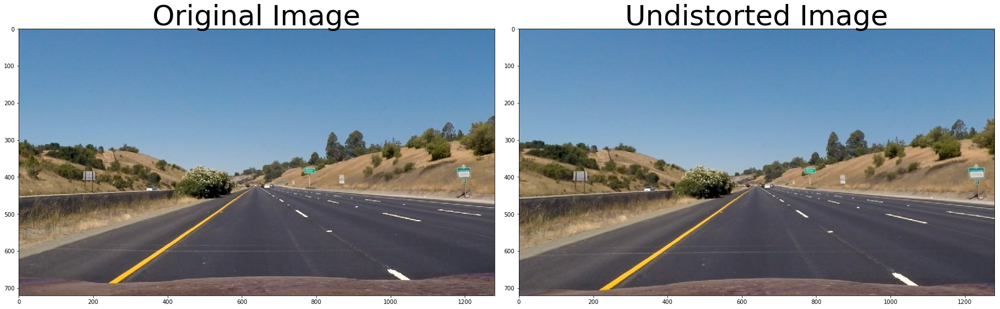

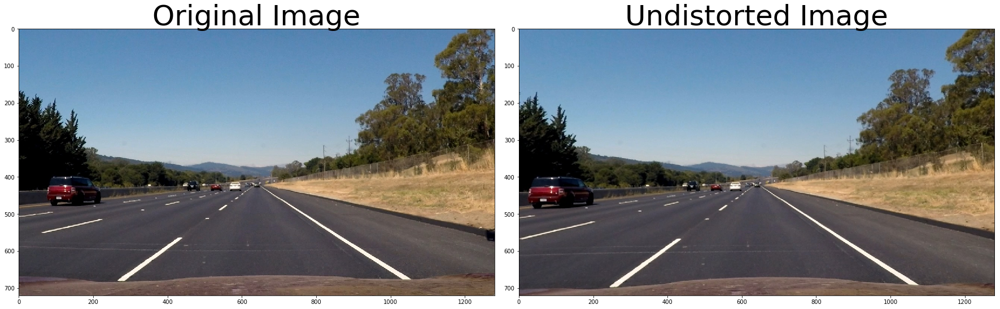

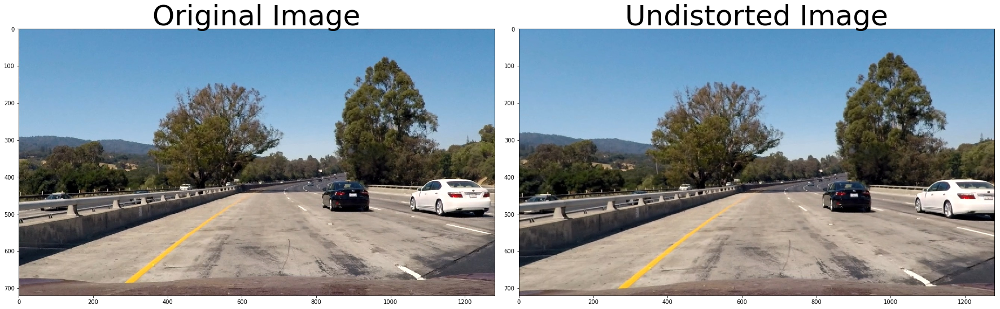

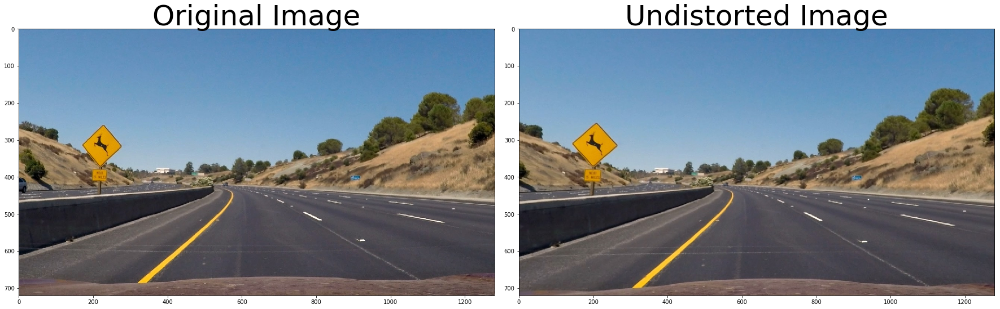

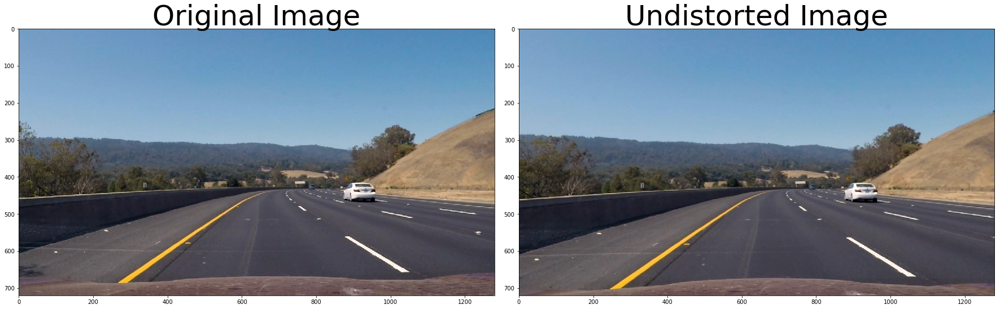

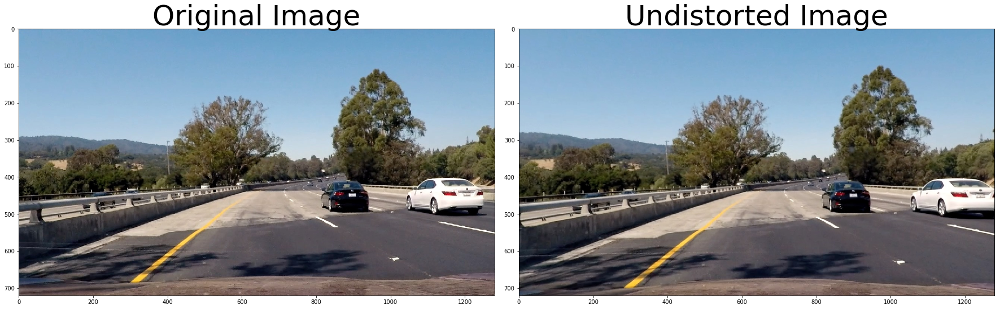

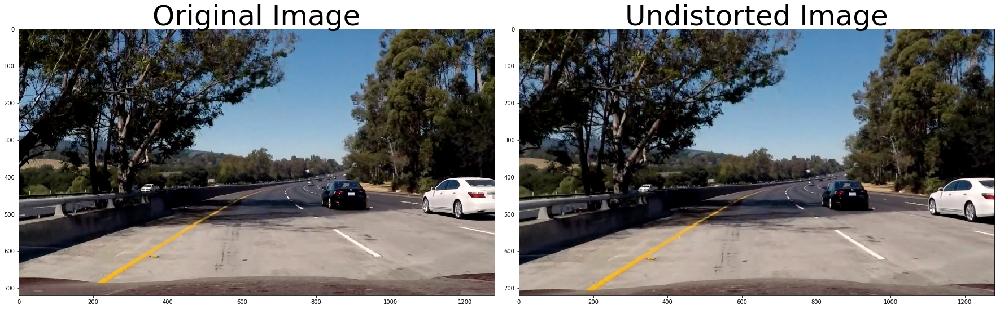

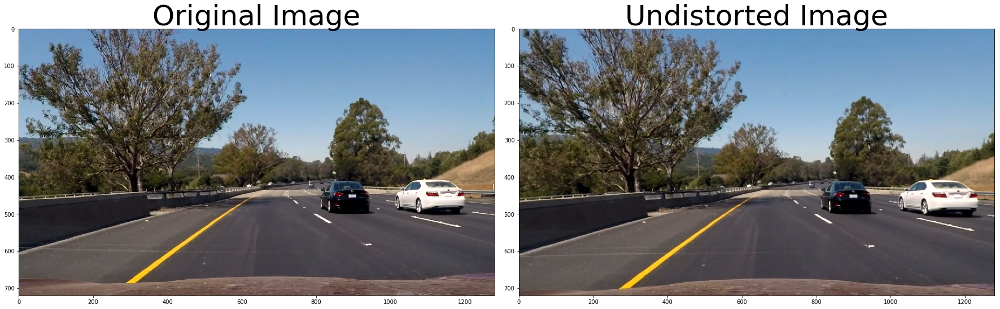

In [4]:
# dst = cv2.undistort(img, mtx, dist, None, mtx)
# plt.imshow(dst)

# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')
orig_images = []
dst_images = []
filenamelist = []

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    plot_two_imgs(img, dst, 'Original Image', 'Undistorted Image')
    
    # save images
    file = os.path.basename(fname)
#     plt.savefig('../output_images/undistort/' + file)
    filenamelist.append(file)
    
    orig_images.append(img)
    dst_images.append(dst)

---

## Use color transforms, gradients, etc., to create a thresholded binary image

In [5]:
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    combine = np.zeros_like(s_channel)
    combine[(sxbinary == 1) | (s_binary == 1)] = 1
    color_binary = np.dstack((combine, combine, combine)) * 255

    return color_binary

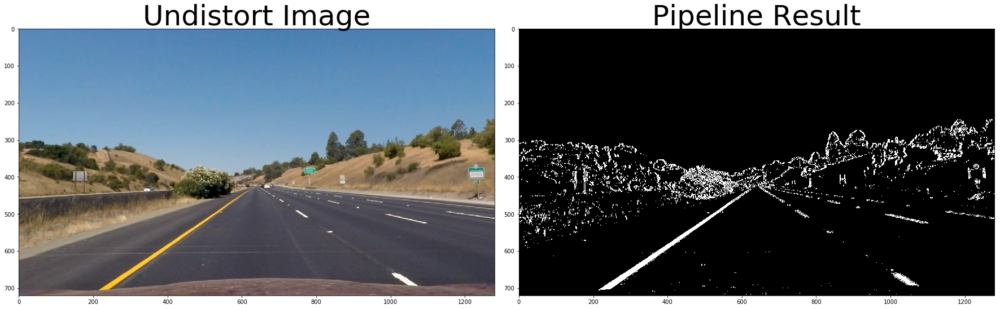

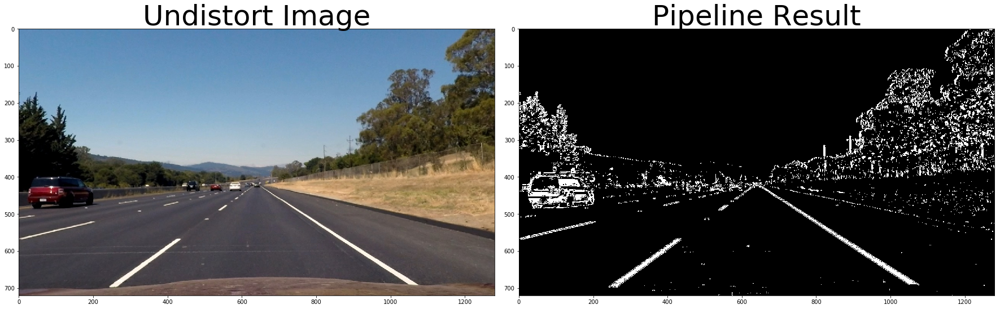

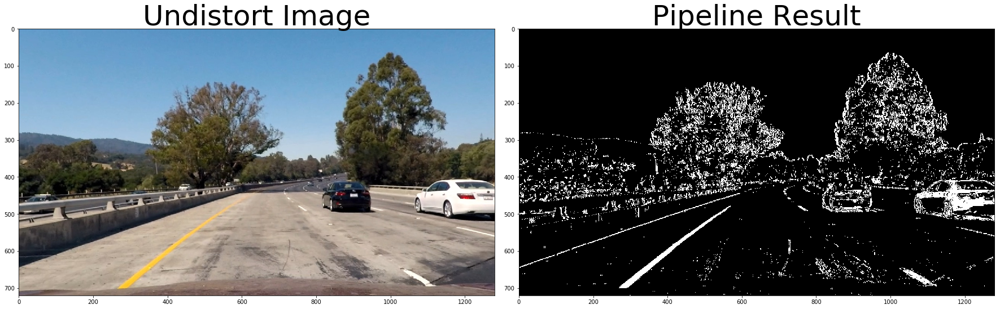

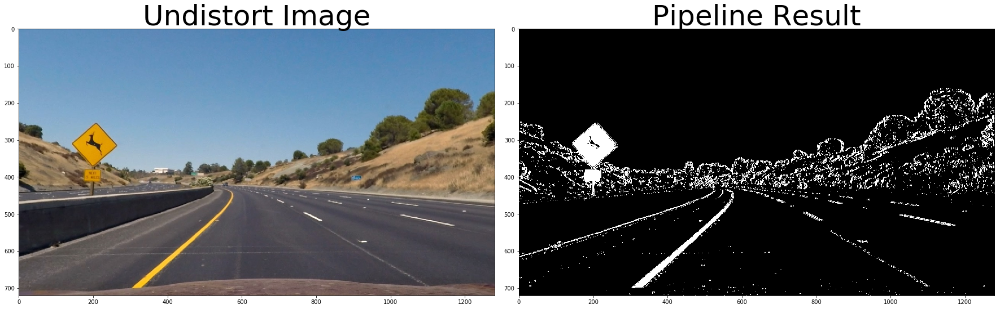

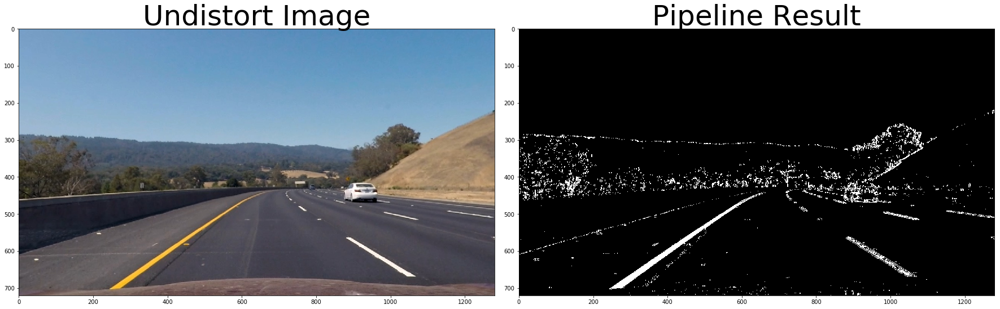

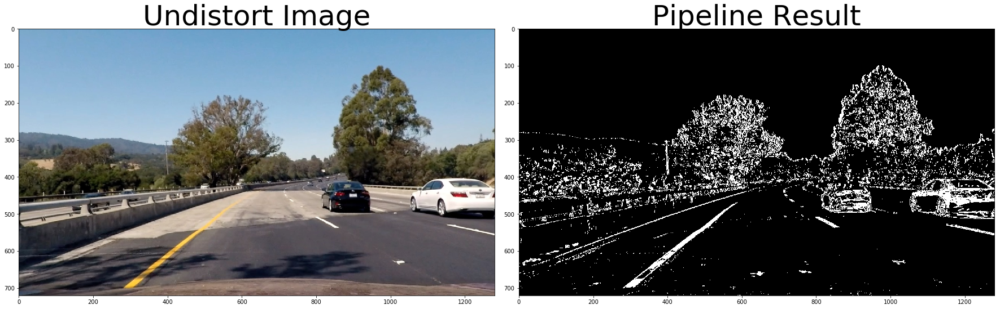

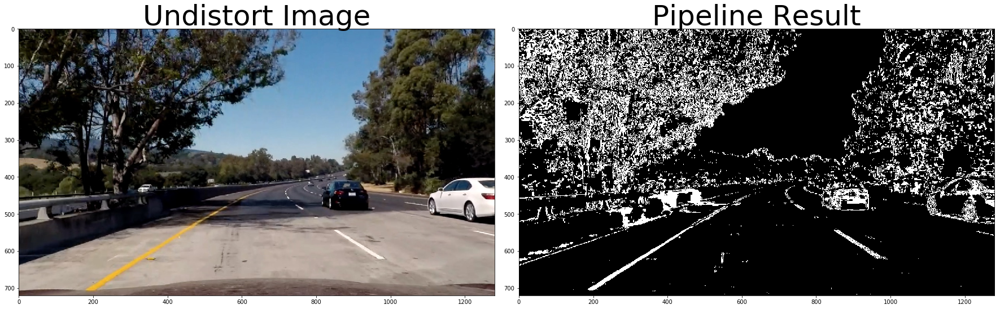

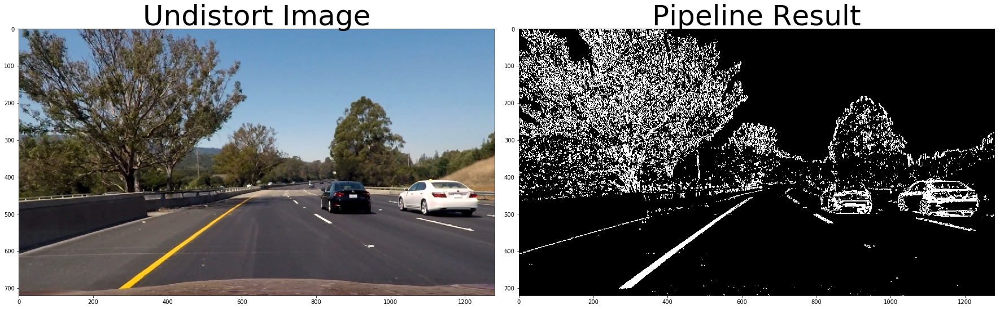

In [6]:
binary_imgs = []

for img, filename in zip(dst_images, filenamelist):
    binary_img = pipeline(img)
    binary_imgs.append(binary_img)
    # Plot the result
    plot_two_imgs(img, binary_img, 'Undistort Image', 'Pipeline Result')

    # save images
#     plt.savefig('../output_images/binary/' + filename)

---

## Apply a perspective transform to rectify binary image ("birds-eye view").

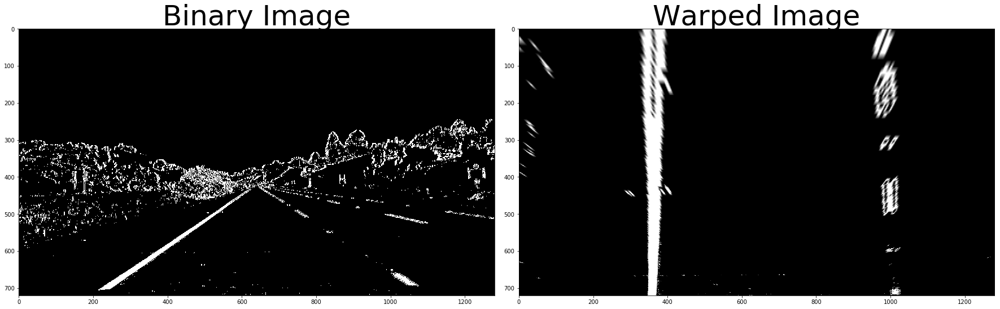

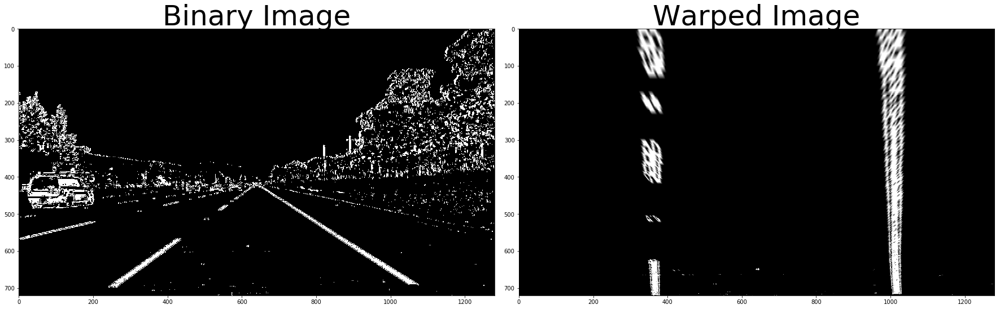

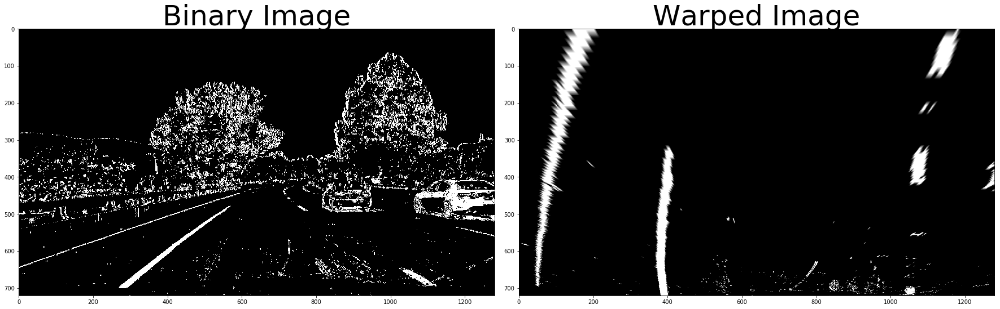

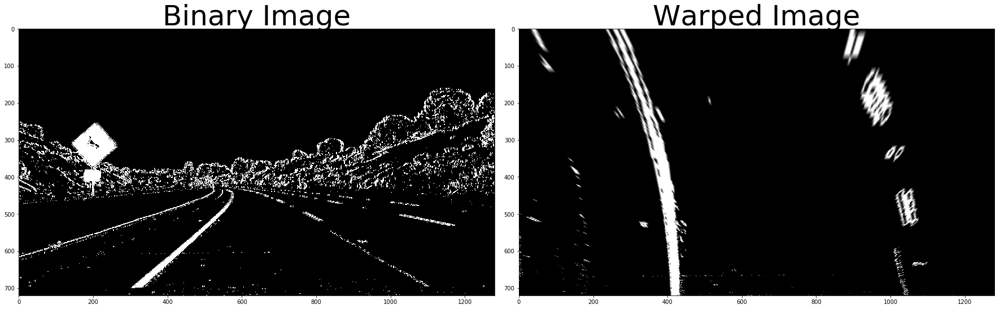

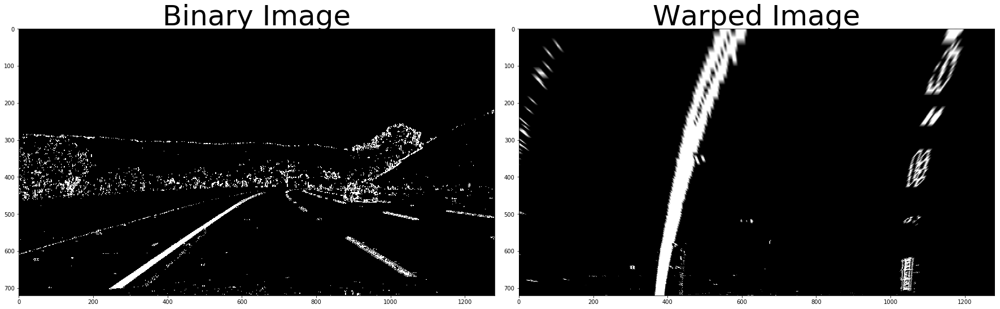

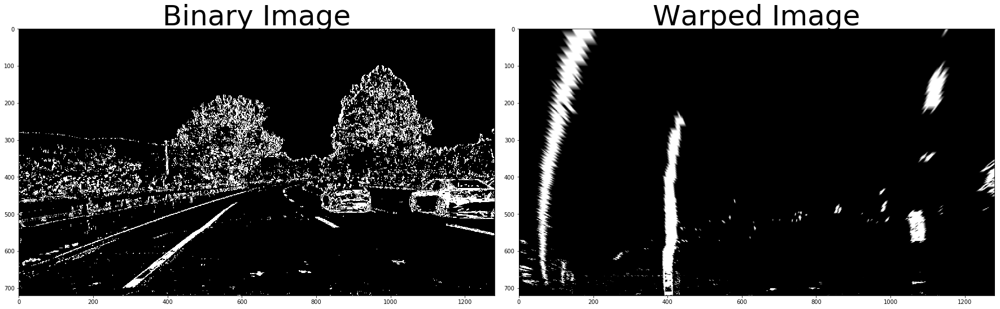

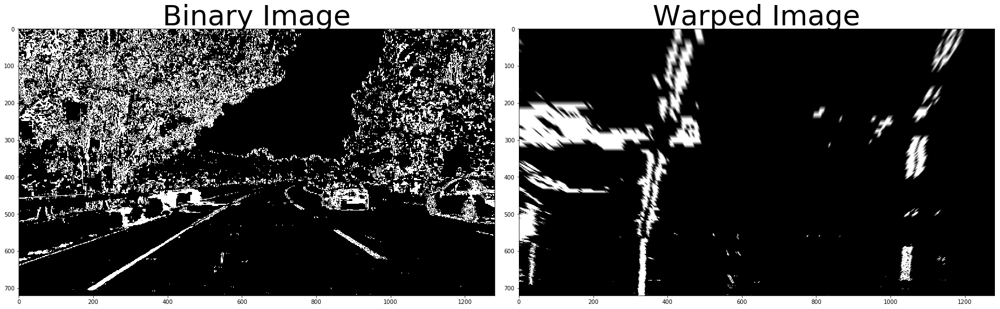

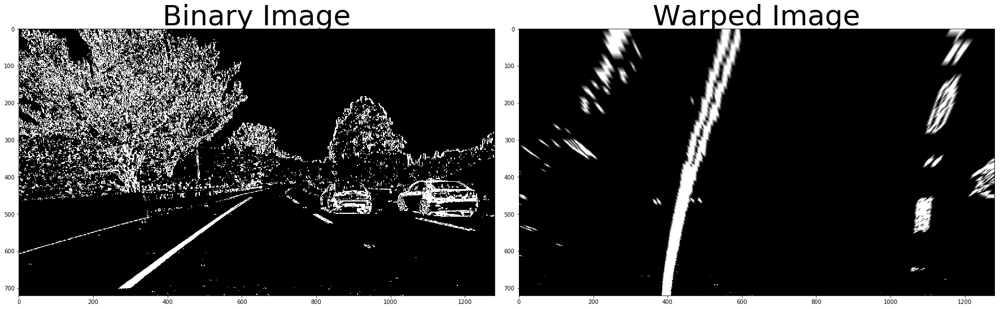

In [7]:
def birds_eye_view(binary_img):
    # Move the points in the image
    src = np.float32([
        [691, 450],
        [1070, 700],
        [230, 700],
        [595, 450],
    ])

    dst = np.float32([    
        [1010, -100],
        [1010, 720],
        [354, 720],
        [354, -100]
    ])

    # Debug
#     plt.figure(figsize=(20,10))
#     plt.imshow(binary_img)
#     cv2.polylines
#     plt.scatter(src[:,0], src[:,1], c='r', marker='.')
#     plt.show()

    perspective_matrix = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(binary_img, perspective_matrix, (1280, 720))
    
    return warped
    
warped_images = []
for bin_img, file_name in zip(binary_imgs, filenamelist):
    warped = birds_eye_view(bin_img)
    warped_images.append(warped)
    plot_two_imgs(bin_img, warped, 'Binary Image', 'Warped Image')
#     plt.savefig('../output_images/birds_eye/' + file_name)

---

## Detect lane pixels and fit to find the lane boundary.

In [8]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print('number of pixels between lines:', rightx_base - leftx_base)

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        #pass # Remove this when you add your function
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

#     # Plots the left and right polynomials on the lane lines
#     plt.imshow(out_img)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
    
#     # save figure
# #     plt.savefig('../output_images/detect_line/' + filename)
    
#     plt.show()

    return out_img, left_fit, right_fit, left_fitx, right_fitx, ploty

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
#     # Plot the polynomial lines onto the image
#     plt.imshow(result)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.show()
#     ## End visualization steps ##
    
    return result, left_fitx, right_fitx, ploty, leftx, lefty, rightx, righty

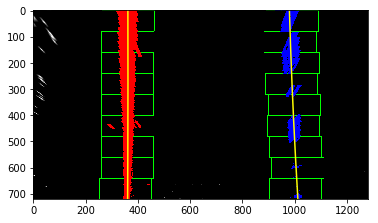

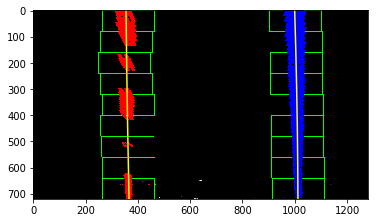

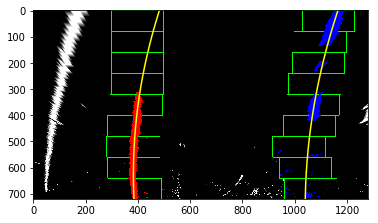

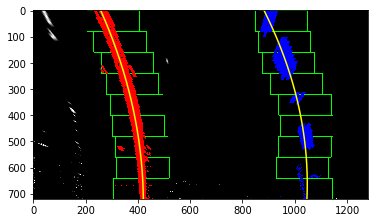

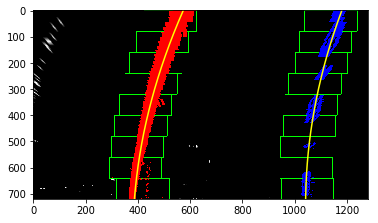

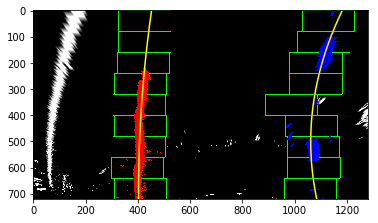

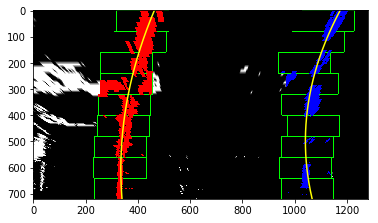

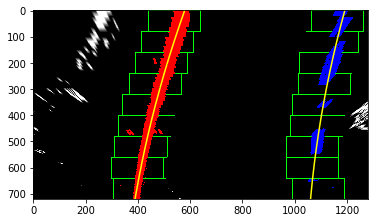

In [9]:
left_fit_list = []
right_fit_list = []

for img, filename in zip(warped_images, filenamelist):
    out_img, left_fit, right_fit, left_fitx, right_fitx, ploty = fit_polynomial(img[:,:,0])
    left_fit_list.append(left_fit)
    right_fit_list.append(right_fit)
    
    # Plots the left and right polynomials on the lane lines
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    
    # save figure
#     plt.savefig('../output_images/detect_line/' + filename)
    
    plt.show()

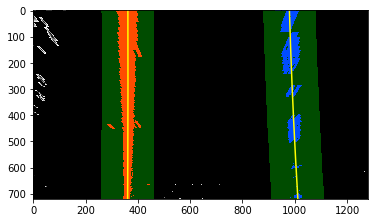

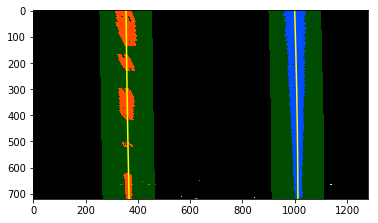

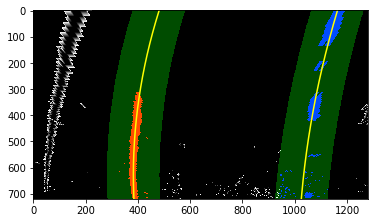

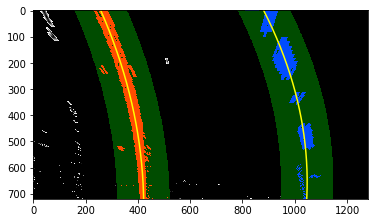

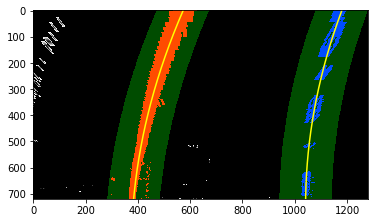

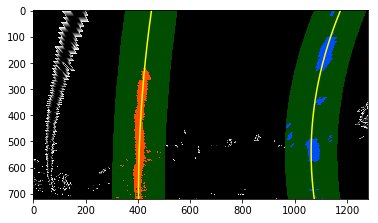

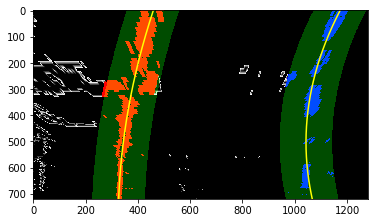

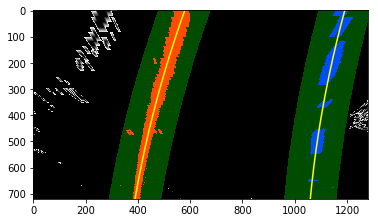

In [10]:
left_fit_list_prior = []
right_fit_list_prior = []
ploty_list_prior = []
leftx_list = []
lefty_list = []
rightx_list = []
righty_list = []

for img, filename, left_fit, right_fit in zip(warped_images, filenamelist, left_fit_list, right_fit_list):
    result, left_fitx, right_fitx, ploty, leftx, lefty, rightx, righty = search_around_poly(img[:,:,0], left_fit, right_fit)
    left_fit_list_prior.append(left_fitx)
    right_fit_list_prior.append(right_fitx)
    ploty_list_prior.append(ploty)
    leftx_list.append(leftx)
    lefty_list.append(lefty)
    rightx_list.append(rightx)
    righty_list.append(righty)
    
    # Plot the polynomial lines onto the image
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.show()
    ## End visualization steps ##

---

## Determine the curvature of the lane and vehicle position with respect to center.

In [11]:
def measure_curvature_pixels(ploty, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = (1+(2*left_fit[0]*y_eval+left_fit[1])**2)**1.5/np.abs(2*left_fit[0])  ## Implement the calculation of the left line here
    right_curverad = (1+(2*right_fit[0]*y_eval+right_fit[1])**2)**1.5/np.abs(2*right_fit[0])  ## Implement the calculation of the right line here
    
    return left_curverad, right_curverad

In [12]:
for ploty, left_fit, right_fit in zip(ploty_list_prior, left_fit_list_prior, right_fit_list_prior):
    left_cuverad, right_curverad = measure_curvature_pixels(ploty, left_fit, right_fit)
    print(left_cuverad, right_curverad)

1.95208405976e+14 1.42950919867e+15
1.87543730509e+14 1.48894523073e+15
3.45042763096e+14 2.01533845266e+15
9.95510420795e+13 1.15764882074e+15
4.89176138087e+14 2.07341759372e+15
3.04495617155e+14 2.05489346406e+15
3.13875072321e+14 2.0499072968e+15
4.99203841927e+14 2.11288977025e+15


In [13]:
def measure_curvature_real(ploty, leftx, lefty, rightx, righty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/700 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit poly in real space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def vehicle_offset(center, left_lane_pos, right_lane_pos):
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    return ((left_lane_pos + right_lane_pos)/2 - center) * xm_per_pix

In [14]:
curverad_list = []
offset_list = []

for img, ploty, leftx, lefty, rightx, righty in zip(warped_images, ploty_list_prior, leftx_list, lefty_list, rightx_list, righty_list):
    left_cuverad, right_curverad = measure_curvature_real(ploty, leftx, lefty, rightx, righty)
    print('left:', left_cuverad, 'm', 'right:', right_curverad, 'm', 'average:', (left_cuverad+right_curverad)/2, 'm')
    offset = vehicle_offset(img.shape[1]/2, leftx[-1], rightx[-1])
    print('offset:', offset, 'm')
    curverad_list.append((left_cuverad+right_curverad)/2)
    offset_list.append(offset)

left: 31753.1746277 m right: 8143.45253609 m average: 19948.3135819 m
offset: 0.301285714286 m
left: 23804.9605987 m right: 8971.18400003 m average: 16388.0722994 m
offset: 0.330357142857 m
left: 696.572379169 m right: 1160.49141451 m average: 928.531896841 m
offset: 0.618428571429 m
left: 595.409210236 m right: 448.419334651 m average: 521.914272443 m
offset: 0.6475 m
left: 733.674561299 m right: 694.767252006 m average: 714.220906652 m
offset: 0.399071428571 m
left: 1725.48540247 m right: 458.599588886 m average: 1092.04249568 m
offset: 0.695071428571 m
left: 857.86386494 m right: 339.451245092 m average: 598.657555016 m
offset: 0.446642857143 m
left: 1350.85186635 m right: 1414.30213969 m average: 1382.57700302 m
offset: 0.634285714286 m


---

## Warp the detected lane boundaries back onto the original image.
## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

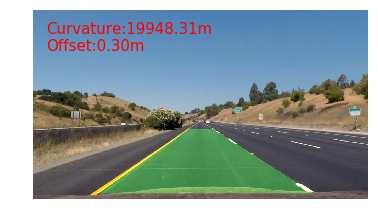

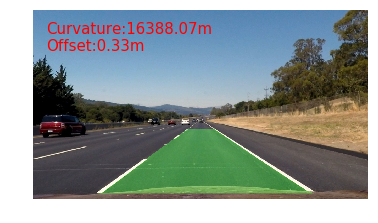

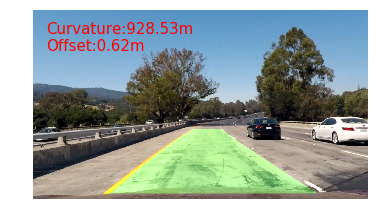

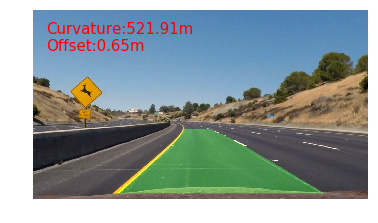

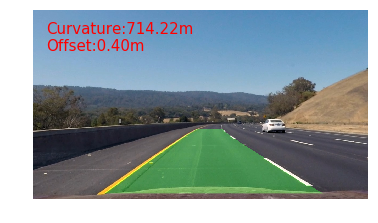

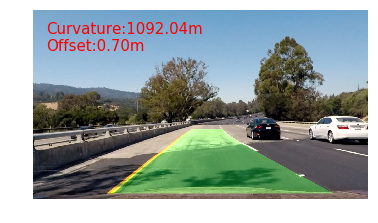

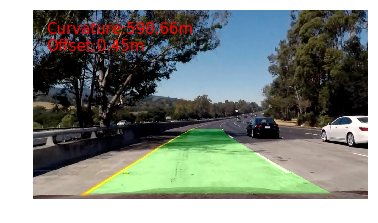

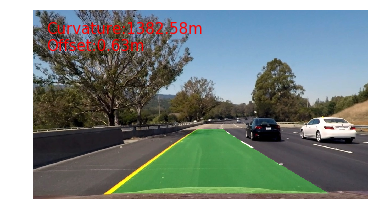

In [15]:
def birds_eye2original(image, undist_img, warped_img, left_fitx, right_fitx, ploty):
    
    # Move the points in the image
    dst = np.float32([
        [691, 450],
        [1070, 700],
        [230, 700],
        [595, 450],
    ])

    src = np.float32([    
        [1010, -100],
        [1010, 720],
        [354, 720],
        [354, -100]
    ])

    Minv = cv2.getPerspectiveTransform(src, dst)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist_img, 1, newwarp, 0.3, 0)
#     plt.imshow(result)
    
    return result

for orig, dst, warped, file, left_fit, right_fit, ploty, curv, offset in zip(orig_images, dst_images, warped_images, filenamelist, left_fit_list_prior, right_fit_list_prior, ploty_list_prior, curverad_list, offset_list):
    result = birds_eye2original(orig, dst, warped[:,:,0], left_fit, right_fit, ploty)
    plt.imshow(result)
    plt.text(50, 40, 'Curvature:{curv:.2f}m\nOffset:{offset:.2f}m'.format(curv=curv, offset=offset), color="red", fontdict={"fontsize": 15,"ha":"left","va":"top"})
    plt.axis('off')
#     plt.savefig('../output_images/result/' + file)
    plt.show()

---

## Test On Videos

In [16]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [17]:
def check_lane_width(leftx, rightx):
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    width = (rightx - leftx) * xm_per_pix
    if width > 4.0 or width < 3.0:
        return False, width
    else:
        return True, width

In [18]:
# Global variables
is_set_old = False
# left_fit_old = []
# right_fit_old = []
left_fitx_old = []
right_fitx_old = []
ploty_old = []

def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    
    global is_set_old
#     global left_fit_old
#     global right_fit_old
    global left_fitx_old
    global right_fitx_old
    global ploty_old
    
    # distortion correction
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    
    # binary image
    binary_img = pipeline(dst)
    
    # perspective transform
    warped_img = birds_eye_view(binary_img)
    
    # Detect lane pixels
#     if is_set_old == False:
#         out_img, left_fit, right_fit, left_fitx, right_fitx, ploty = fit_polynomial(warped_img[:,:,0])
#         left_fit_old = left_fit
#         right_fit_old = right_fit
    out_img, left_fit, right_fit, left_fitx, right_fitx, ploty = fit_polynomial(warped_img[:,:,0])
    out_img, left_fitx, right_fitx, ploty, leftx, lefty, rightx, righty = search_around_poly(warped_img[:,:,0], left_fit, right_fit)
    
    # Mesurement curvature
    left_cuverad, right_curverad = measure_curvature_real(ploty, leftx, lefty, rightx, righty)
    curv = (left_cuverad+right_curverad)/2
    
    # Offset
    offset = vehicle_offset(image.shape[1]/2, leftx[-1], rightx[-1])
    
    # Check result
    # for first time
    if is_set_old == False:
        left_fitx_old = left_fitx
        right_fitx_old = right_fitx
        ploty_old = ploty
        is_set_old = True
    
    # lane width check
    lane_condition, lane_width = check_lane_width(leftx[-1], rightx[-1])
    if lane_condition == False:
        # Use old parameters
        left_fitx = left_fitx_old
        right_fitx = right_fitx_old
        ploty = ploty_old
    else:
        # save result
#         left_fit_old = left_fit
#         right_fit_old = right_fit
        left_fitx_old = left_fitx
        right_fitx_old = right_fitx
        ploty_old = ploty
    
    # Create result
    result = birds_eye2original(image, dst, warped_img[:,:,0], left_fitx, right_fitx, ploty)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Curvature:{curv:.2f}m  Offset:{offset:.2f}m'.format(curv=curv, offset=offset), (50,40), font, 1, (255,0,0), 2, cv2.LINE_AA)
    cv2.putText(result, 'Lane width:{width:.2f}m'.format(width=lane_width), (50,70), font, 1, (255,0,0), 2, cv2.LINE_AA)
    if lane_condition == False:
        cv2.putText(result, 'Lane detection failure. Use previous parameter', (50,100), font, 1, (255,0,0), 2, cv2.LINE_AA)
    return result

In [19]:
is_set_old = False
video_output = '../project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("../project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("../project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ../project_video_output.mp4
[MoviePy] Writing video ../project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:18<00:00,  4.83it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_video_output.mp4 

Wall time: 4min 20s


In [20]:
is_set_old = False
video_output = '../challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ../challenge_video_output.mp4
[MoviePy] Writing video ../challenge_video_output.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:34<00:00,  5.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../challenge_video_output.mp4 

Wall time: 1min 36s


In [21]:
is_set_old = False
video_output = '../harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ../harder_challenge_video_output.mp4
[MoviePy] Writing video ../harder_challenge_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [05:47<00:00,  3.88it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../harder_challenge_video_output.mp4 

Wall time: 5min 49s
